# Cross Spectral Density

In [1]:
import xarray as xr
import hvplot.xarray
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from dask.distributed import Client
import holoviews as hv
from bokeh.io import export_svgs

In [2]:
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 8
Total threads: 32,Total memory: 62.79 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:33949,Workers: 8
Dashboard: http://127.0.0.1:8787/status,Total threads: 32
Started: Just now,Total memory: 62.79 GiB
Comm: tcp://127.0.0.1:39681,Total threads: 4
Dashboard: http://127.0.0.1:40595/status,Memory: 7.85 GiB
Nanny: tcp://127.0.0.1:33037,


In [6]:
fn = '/datadrive/lfhydrophone/AXCC1_AXEC2_csd_4096pts.nc'
csd = xr.open_dataarray(fn)
csd = csd.rename({'time_frequency':'frequency'})

csd = csd.load()

### Plot CSV

In [9]:
csd_plot = (20*np.log10(csd)).hvplot.image(
    x='time',
    rasterize=True,
    cmap='inferno',
    ylim=(0,90),
    ylabel='frequency [Hz]',
    xlabel='',
    clabel='normalized dB',
    width=1000,
    height=400)

csd_plot
# Render the plot with Bokeh
# renderer = hv.render(csd_plot, backend='bokeh')

# Save the plot as SVG with rasterized image components
# export_svgs(renderer, filename="test.svg")

:DynamicMap   []
   :Image   [time,frequency]   (csd)

### Plot SPDFs (before and after 2019)

In [17]:
csd_before = csd.loc[:, :pd.Timestamp('2019-01-01')].dropna(dim='time')
csd_after = csd.loc[:, pd.Timestamp('2019-01-01'):].dropna(dim='time')

In [47]:
freqs = list(csd.frequency.values)

spdf_before = []
spdf_after = []

for freq in tqdm(freqs):
    
    Hbefore,_ = np.histogram(csd_before.sel({'frequency':freq}), bins=np.linspace(20,120,1000), density=True)
    Hafter,_ = np.histogram(csd_after.sel({'frequency':freq}), bins=np.linspace(20,120,1000), density=True)

    spdf_before.append(Hbefore)
    spdf_after.append(Hafter)
    
spdf_before = np.array(spdf_before)
spdf_after = np.array(spdf_after)

100%|████████████████████████████████████████| 513/513 [00:02<00:00, 208.20it/s]


In [56]:
freq

100.0

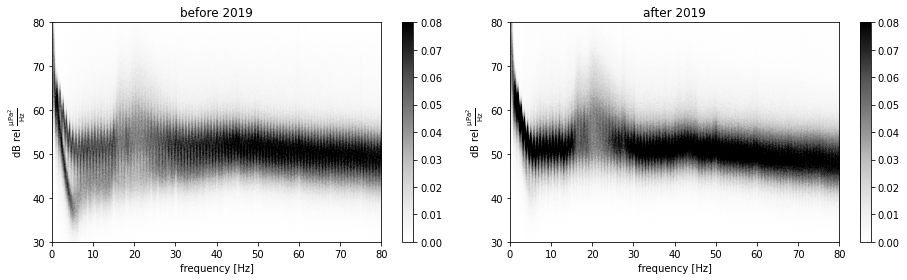

In [83]:
fig = plt.figure(figsize=(13,4))

plt.subplot(1,2,1)
im1 = plt.imshow(spdf_before.T,vmax=0.08, cmap='Greys', extent=[0,100,120,20], aspect='auto')
im1.set_rasterized(True)
plt.colorbar()
plt.xlim([0,80])
plt.ylim([30, 80])
plt.xlabel('frequency [Hz]')
plt.ylabel(r'dB rel $\mathrm{\frac{\mu Pa^2}{Hz}}$')
plt.title('before 2019')

plt.subplot(1,2,2)
im2 = plt.imshow(spdf_after.T,vmax=0.08, cmap='Greys', extent=[0,100,120,20], aspect='auto')
im2.set_rasterized(True)
plt.colorbar()
plt.xlim([0,80])
plt.ylim([30, 80])
plt.title('after 2019')
plt.xlabel('frequency [Hz]')
plt.ylabel(r'dB rel $\mathrm{\frac{\mu Pa^2}{Hz}}$')


plt.tight_layout()

fig.savefig('figures/csd/spdfs.svg', dpi=300)

In [19]:
num_bins=1000
histogram = csd_before.groupby_bins('frequency', bins=np.linspace(20,120,1000)).count()

Text(0, 0.5, 'dB rel $\\mathrm{\\frac{\\mu Pa^2}{Hz}}$')

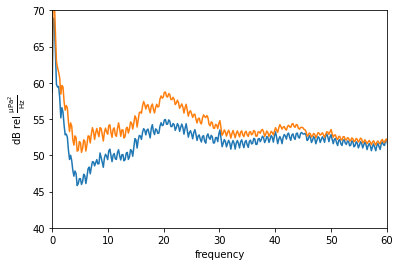

In [28]:
csd_before.mean('time').plot()
csd_after.mean('time').plot()

plt.xlim([0,60])
plt.ylim([40,70])
plt.ylabel(r'dB rel $\mathrm{\frac{\mu Pa^2}{Hz}}$')